## Updates 1

- I have added code that does model prediction visualization by putting it in camera frame. I found this to be more intuitive than visualizing it in lidar frame.
I hope you find it useful.

If you check out the reference model in [lyft devkit](https://github.com/lyft/nuscenes-devkit/tree/master/notebooks), you will find that they are using map masks for training UNET. The map masks are first extracted around the corresponding ego region and used as 3 additional channels. This seems to be give some improvement in lb score.

In this notebook i do inference using such a trained trained model.
I have extracted the ego centered maps and made a train and test dataset. You can find it [here](https://www.kaggle.com/meaninglesslives/lyft3d-mask-test-data). It takes a long time to compute on test set, so i am sharing it here :-D

## Updates 2
I have added code that shows how you can easily ensemble your models. Here, I use same models at different epochs of training. Even such a simple approach gives a slight boost. To get a bigger boost, you can try training models with different architectures. Good Luck !


# Visualizing some model predictions


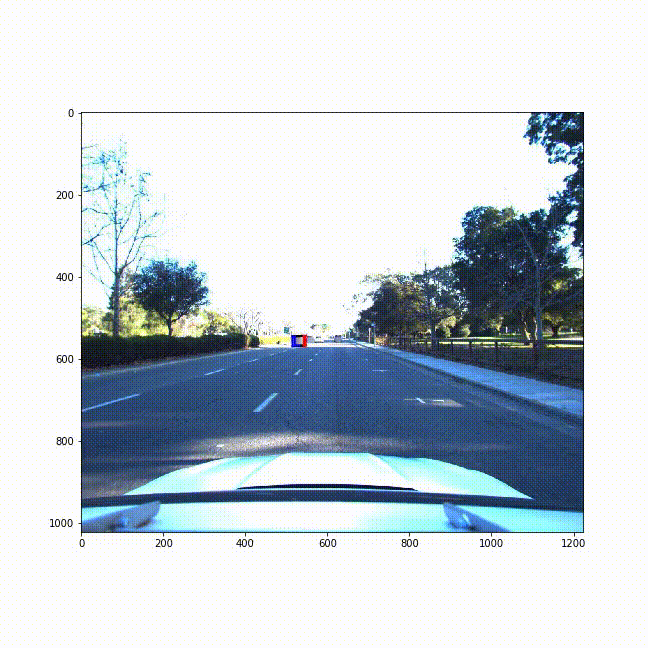

In [1]:
fn = '/home/hsb2140/deep-learnging-3d-object-dectation/input/lyft3d-mask-test-data/model_preds.gif'
from IPython.display import Image
Image(filename=fn)

# Install the Lyft SDK

In [2]:
# !pip install lyft-dataset-sdk -q
# !pip install moviepy -q
# !pip install mlcomp -q
# !mlcomp init

In [3]:
# ! python /home/hsb2140/deep-learnging-3d-object-dectation/input/mlcomp/setup.py

In [4]:
from datetime import datetime
from functools import partial
import glob
import torch
from multiprocessing import Pool
from util import *

# Disable multiprocesing for numpy/opencv. We already multiprocess ourselves, this would mean every subprocess produces
# even more threads which would lead to a lot of context switching, slowing things down a lot.
import os
os.environ["OMP_NUM_THREADS"] = "1"

import matplotlib.pyplot as plt
%matplotlib inline

import pandas as pd
import cv2
from PIL import Image
import numpy as np
from tqdm import tqdm, tqdm_notebook
import scipy
import scipy.ndimage
import scipy.special
from scipy.spatial.transform import Rotation as R

from lyft_dataset_sdk.lyftdataset import LyftDataset
from lyft_dataset_sdk.utils.data_classes import LidarPointCloud, Box, Quaternion
from lyft_dataset_sdk.utils.geometry_utils import view_points, transform_matrix

import time
from lyft_dataset_sdk.utils.map_mask import MapMask
from pathlib import Path
from lyft_dataset_sdk.lyftdataset import LyftDataset,LyftDatasetExplorer

# Lyft SDK requires creating a link to input folders

In [5]:
# !ln -s /kaggle/input/3d-object-detection-for-autonomous-vehicles/test_images images
# !ln -s /kaggle/input/3d-object-detection-for-autonomous-vehicles/test_maps maps
# !ln -s /kaggle/input/3d-object-detection-for-autonomous-vehicles/test_lidar lidar

In [6]:
classes = ["car", "motorcycle", "bus", "bicycle", "truck", "pedestrian", "other_vehicle", "animal", "emergency_vehicle"]
train_dataset = LyftDataset(data_path='/home/ys3152/train_dataset', json_path='/home/ys3152/train_data', verbose=True)

9 category,
18 attribute,
4 visibility,
18421 instance,
10 sensor,
148 calibrated_sensor,
177789 ego_pose,
180 log,
180 scene,
22680 sample,
189504 sample_data,
638179 sample_annotation,
1 map,
Done loading in 11.2 seconds.
Reverse indexing ...
Done reverse indexing in 4.6 seconds.


# Find the mean height of all categories
We can use the mean height instead of blindly using 1.75m for all categories

In [7]:
class_heights = {'animal':0.51,'bicycle':1.44,'bus':3.44,'car':1.72,'emergency_vehicle':2.39,'motorcycle':1.59,
                'other_vehicle':3.23,'pedestrian':1.78,'truck':3.44}
level5data = LyftDataset(data_path='/home/ys3152/test_dataset', json_path='/home/ys3152/test_data', verbose=True)

JSON file instance.json missing, using empty list
JSON file sample_annotation.json missing, using empty list
9 category,
17 attribute,
4 visibility,
0 instance,
8 sensor,
168 calibrated_sensor,
219744 ego_pose,
218 log,
218 scene,
27468 sample,
219744 sample_data,
0 sample_annotation,
1 map,
Done loading in 3.3 seconds.
Reverse indexing ...
Done reverse indexing in 1.2 seconds.


In [9]:
# Some hyperparameters we'll need to define for the system
voxel_size = (0.4, 0.4, 1.5)
z_offset = -2.0
bev_shape = (336, 336, 3)

# We scale down each box so they are more separated when projected into our coarse voxel space.
box_scale = 0.8

In [10]:
records = [(level5data.get('sample', record['first_sample_token'])['timestamp'], record) for record in level5data.scene]

entries = []

for start_time, record in sorted(records):
    start_time = level5data.get('sample', record['first_sample_token'])['timestamp'] / 1000000

    token = record['token']
    name = record['name']
    date = datetime.utcfromtimestamp(start_time)
    host = "-".join(record['name'].split("-")[:2])
    first_sample_token = record["first_sample_token"]

    entries.append((host, name, date, token, first_sample_token))
            
df = pd.DataFrame(entries, columns=["host", "scene_name", "date", "scene_token", "first_sample_token"])

In [11]:
df.head()

,host,scene_name,date,scene_token,first_sample_token
0,host-a007,host-a007-lidar0-1230678335199240106-123067836...,2019-01-04 23:05:35.302051,582583077b5db62b9b95d780c7fb3214f2fb6680ec61ef...,57b51d24fad1c39065f80c9f769b3ff8d29e17e0cf92f5...
1,host-a007,host-a007-lidar0-1230931253199029066-123093127...,2019-01-07 21:20:53.301923,795a318208bdc612f92eabe3af3102f9e55db4b6c1e44e...,780168b66b14e7f826b365d7f5f0ec602d70fc5df4edb9...
2,host-a007,host-a007-lidar0-1230939239197974066-123093926...,2019-01-07 23:33:59.300673,84ae53a19295800de1565ea5e61ef0d5e3d938a4b0601c...,99e78fc0682700b8be3635ef06231d813951d038e48795...
3,host-a009,host-a009-lidar0-1231184014198521956-123118403...,2019-01-10 19:33:34.301170,225300b10634526aafdce9bb3e00e863b24663e6766041...,c88dfa9d87d41079250dd7488f9ee3721dfda7e5b45563...
4,host-a008,host-a008-lidar0-1231272360198562866-123127238...,2019-01-11 20:06:00.301206,07b333dad30191a7d3048919c420083a7f53296b885038...,2299492f339a64c15d192e1b9ac3836917fb77660a4d72...


In [12]:
# sample_sub = pd.read_csv('../input/3d-object-detection-for-autonomous-vehicles/sample_submission.csv')
all_sample_tokens,scene_len = [],[]
for sample_token in tqdm_notebook(df.first_sample_token.values):
    i = 0
    while sample_token:
        all_sample_tokens.append(sample_token)
        sample = level5data.get("sample", sample_token)
        sample_token = sample["next"]
        i += 1
    scene_len.append(i)
#     print(len(all_sample_tokens[-1]))
    
print('Total number of tokens=',len(all_sample_tokens))


Total number of tokens= 27468


In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data

test_data_folder = '/home/hsb2140/deep-learnging-3d-object-dectation/input/lyft3d-mask-test-data/test_data/test_data'



test_dataset = BEVImageDataset(all_sample_tokens,test_data_folder)

# Unet Model

We train a U-net fully convolutional neural network, we create a network that is less deep and with only half the amount of filters compared to the original U-net paper implementation. We do this to keep training and inference time low.

In [17]:
# We weigh the loss for the 0 class lower to account for (some of) the big class imbalance.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
class_weights = torch.from_numpy(np.array([0.2] + [1.0]*len(classes), dtype=np.float32))
class_weights = class_weights.to(device)
print(np.array([1.0]*len(classes), dtype=np.float32))
print(class_weights)
print(device)

[1. 1. 1. 1. 1. 1. 1. 1. 1.]
tensor([0.2000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000], device='cuda:0')
cuda


# Loading trained Unet models

In [18]:
batch_size = 16
model10 = get_unet_model(num_output_classes=len(classes)+1)

state = torch.load('/home/hsb2140/deep-learnging-3d-object-dectation//input/lyft3d-mask-test-data/unet_checkpoint_epoch_10.pth')
model10.load_state_dict(state)
model10 = model10.to(device)
model10.eval();


model9 = get_unet_model(num_output_classes=len(classes)+1)

state = torch.load('/home/hsb2140/deep-learnging-3d-object-dectation//input/lyft3d-mask-test-data/unet_checkpoint_epoch_9.pth')
model9.load_state_dict(state)
model9 = model9.to(device)
model9.eval();

model8 = get_unet_model(num_output_classes=len(classes)+1)

state = torch.load('/home/hsb2140/deep-learnging-3d-object-dectation//input/lyft3d-mask-test-data/unet_checkpoint_epoch_8.pth')
model8.load_state_dict(state)
model8 = model8.to(device)
model8.eval();

## We can use MLComp to ensemble multiple models easily.
It can also be used to TTA. Reduces boiler plate code.


In [19]:
model = Model([model8,model9,model10])

In [21]:
# We perform an opening morphological operation to filter tiny detections
# Note that this may be problematic for classes that are inherently small (e.g. pedestrians)..
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))

# Test Set Predictions

In [ ]:
import gc
gc.collect()
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size, shuffle=False, num_workers=os.cpu_count()*2)
progress_bar = tqdm_notebook(test_loader)

# We quantize to uint8 here to conserve memory. We're allocating >20GB of memory otherwise.
# predictions = np.zeros((len(test_loader), 1+len(classes), 336, 336), dtype=np.uint8)

sample_tokens = []
all_losses = []

detection_boxes = []
detection_scores = []
detection_classes = []

# Arbitrary threshold in our system to create a binary image to fit boxes around.
background_threshold = 200

with torch.no_grad():
    for ii, (X, batch_sample_tokens) in enumerate(progress_bar):

        sample_tokens.extend(batch_sample_tokens)
        
        X = X.to(device)  # [N, 1, H, W]
        prediction = model(X)  # [N, 2, H, W]
        
        prediction = F.softmax(prediction, dim=1)
        
        prediction_cpu = prediction.cpu().numpy()
        predictions = np.round(prediction_cpu*255).astype(np.uint8)
        
        # Get probabilities for non-background
        predictions_non_class0 = 255 - predictions[:,0]
        
        predictions_opened = np.zeros((predictions_non_class0.shape), dtype=np.uint8)

        for i, p in enumerate(predictions_non_class0):
            thresholded_p = (p > background_threshold).astype(np.uint8)
            predictions_opened[i] = cv2.morphologyEx(thresholded_p, cv2.MORPH_OPEN, kernel)
    
            sample_boxes,sample_detection_scores,sample_detection_classes = calc_detection_box(predictions_opened[i],
                                                                                              predictions[i])
        
            detection_boxes.append(np.array(sample_boxes))
            detection_scores.append(sample_detection_scores)
            detection_classes.append(sample_detection_classes)
        
#         # Visualize the first prediction
#         if ii == 0:
#             visualize_predictions(X, prediction, apply_softmaxiii=False)
            

In [ ]:
print("Total amount of boxes:", np.sum([len(x) for x in detection_boxes]))
    

# Visualize the boxes in the first sample
t = np.zeros_like(predictions_opened[0])
for sample_boxes in detection_boxes[0]:
    box_pix = np.int0(sample_boxes)
    cv2.drawContours(t,[box_pix],0,(255),2)
plt.imshow(t)
plt.show()

# Visualize their probabilities
plt.hist(detection_scores[0], bins=20)
plt.xlabel("Detection Score")
plt.ylabel("Count")
plt.show()

# Transform predicted boxes back into world space

In [ ]:
os.makedirs('/home/hsb2140/deep-learnging-3d-object-dectation/cam_viz',exist_ok=True)
 
from lyft_dataset_sdk.eval.detection.mAP_evaluation import Box3D, recall_precision
import shutil

pred_box3ds = []

max_frames = 128
vid_count = 0
processed_samples = 0
for (sample_token, sample_boxes, sample_detection_scores, sample_detection_class) in tqdm_notebook(zip(sample_tokens, detection_boxes, detection_scores, detection_classes), total=len(sample_tokens)):
    processed_samples += 1
    sample_boxes = sample_boxes.reshape(-1, 2) # (N, 4, 2) -> (N*4, 2)
    sample_boxes = sample_boxes.transpose(1,0) # (N*4, 2) -> (2, N*4)

    # Add Z dimension
    sample_boxes = np.vstack((sample_boxes, np.zeros(sample_boxes.shape[1]),)) # (2, N*4) -> (3, N*4)

    sample = level5data.get("sample", sample_token)
    sample_lidar_token = sample["data"]["LIDAR_TOP"]
    lidar_data = level5data.get("sample_data", sample_lidar_token)
    lidar_filepath = level5data.get_sample_data_path(sample_lidar_token)
    ego_pose = level5data.get("ego_pose", lidar_data["ego_pose_token"])
    ego_translation = np.array(ego_pose['translation'])

    global_from_car = transform_matrix(ego_pose['translation'],
                                       Quaternion(ego_pose['rotation']), inverse=False)

    car_from_voxel = np.linalg.inv(create_transformation_matrix_to_voxel_space(bev_shape, voxel_size, (0, 0, z_offset)))


    global_from_voxel = np.dot(global_from_car, car_from_voxel)
    sample_boxes = transform_points(sample_boxes, global_from_voxel)

    # We don't know at where the boxes are in the scene on the z-axis (up-down), let's assume all of them are at
    # the same height as the ego vehicle.
    sample_boxes[2,:] = ego_pose["translation"][2]


    # (3, N*4) -> (N, 4, 3)
    sample_boxes = sample_boxes.transpose(1,0).reshape(-1, 4, 3)

#     box_height = 1.75
    box_height = np.array([class_heights[cls] for cls in sample_detection_class])

    # Note: Each of these boxes describes the ground corners of a 3D box.
    # To get the center of the box in 3D, we'll have to add half the height to it.
    sample_boxes_centers = sample_boxes.mean(axis=1)
    sample_boxes_centers[:,2] += box_height/2

    # Width and height is arbitrary - we don't know what way the vehicles are pointing from our prediction segmentation
    # It doesn't matter for evaluation, so no need to worry about that here.
    # Note: We scaled our targets to be 0.8 the actual size, we need to adjust for that
    sample_lengths = np.linalg.norm(sample_boxes[:,0,:] - sample_boxes[:,1,:], axis=1) * 1/box_scale
    sample_widths = np.linalg.norm(sample_boxes[:,1,:] - sample_boxes[:,2,:], axis=1) * 1/box_scale
    
    sample_boxes_dimensions = np.zeros_like(sample_boxes_centers) 
    sample_boxes_dimensions[:,0] = sample_widths
    sample_boxes_dimensions[:,1] = sample_lengths
    sample_boxes_dimensions[:,2] = box_height
    
    temp = []
    for i in range(len(sample_boxes)):
        translation = sample_boxes_centers[i]
        size = sample_boxes_dimensions[i]
        class_name = sample_detection_class[i]
        ego_distance = float(np.linalg.norm(ego_translation - translation))
    
        
        # Determine the rotation of the box
        v = (sample_boxes[i,0] - sample_boxes[i,1])
        v /= np.linalg.norm(v)
        r = R.from_dcm([
            [v[0], -v[1], 0],
            [v[1],  v[0], 0],
            [   0,     0, 1],
        ])
        quat = r.as_quat()
        # XYZW -> WXYZ order of elements
        quat = quat[[3,0,1,2]]
        
        detection_score = float(sample_detection_scores[i])

        
        box3d = Box(
            token=sample_token,
            center=list(translation),
            size=list(size),
            orientation=Quaternion(quat),
            name=class_name,
            score=detection_score
        )
        
        temp.append(box3d)
        box3d = Box3D(
            sample_token=sample_token,
            translation=list(translation),
            size=list(size),
            rotation=list(quat),
            name=class_name,
            score=detection_score
        )
        pred_box3ds.append(box3d)


# Creating Submission File

In [ ]:
sub = {}
for i in tqdm_notebook(range(len(pred_box3ds))):
#     yaw = -np.arctan2(pred_box3ds[i].rotation[2], pred_box3ds[i].rotation[0])
    yaw = 2*np.arccos(pred_box3ds[i].rotation[0]);
    pred =  str(pred_box3ds[i].score/255) + ' ' + str(pred_box3ds[i].center_x)  + ' '  + \
    str(pred_box3ds[i].center_y) + ' '  + str(pred_box3ds[i].center_z) + ' '  + \
    str(pred_box3ds[i].width) + ' ' \
    + str(pred_box3ds[i].length) + ' '  + str(pred_box3ds[i].height) + ' ' + str(yaw) + ' ' \
    + str(pred_box3ds[i].name) + ' ' 
        
    if pred_box3ds[i].sample_token in sub.keys():     
        sub[pred_box3ds[i].sample_token] += pred
    else:
        sub[pred_box3ds[i].sample_token] = pred        
    
sample_sub = pd.read_csv('/home/ys3152/sample_submission.csv')
for token in set(sample_sub.Id.values).difference(sub.keys()):
#     print(token)
    sub[token] = ''

In [ ]:
sub = pd.DataFrame(list(sub.items()))
sub.columns = sample_sub.columns
sub.head()

In [ ]:
sub.tail()

In [ ]:
sub.to_csv('/home/hsb2140/lyft3d_pred.csv',index=False)

## Validation Set Predictions

In [26]:
ARTIFACTS_FOLDER = "/home/hsb2140/deep-learnging-3d-object-dectation/input/lyft3d-mask-test-data/"
validation_data_folder = os.path.join(ARTIFACTS_FOLDER, "bev_train_data")

In [27]:
records = [(train_dataset.get('sample', record['first_sample_token'])['timestamp'], record) for record in train_dataset.scene]

entries = []

for start_time, record in sorted(records):
    start_time = train_dataset.get('sample', record['first_sample_token'])['timestamp'] / 1000000

    token = record['token']
    name = record['name']
    date = datetime.utcfromtimestamp(start_time)
    host = "-".join(record['name'].split("-")[:2])
    first_sample_token = record["first_sample_token"]

    entries.append((host, name, date, token, first_sample_token))
            
df = pd.DataFrame(entries, columns=["host", "scene_name", "date", "scene_token", "first_sample_token"])

In [28]:
validation_hosts = ["host-a007", "host-a008", "host-a009"]

validation_df = df[df["host"].isin(validation_hosts)]
vi = validation_df.index
train_df = df[~df.index.isin(vi)]

print(len(train_df), len(validation_df), "train/validation split scene counts")

140 40 train/validation split scene counts


In [30]:
all_sample_tokens,scene_len = [],[]
for sample_token in tqdm_notebook(validation_df.first_sample_token.values):
    i = 0
    while sample_token:
        all_sample_tokens.append(sample_token)
        sample = train_dataset.get("sample", sample_token)
        sample_token = sample["next"]
        i += 1
    scene_len.append(i)
#     print(len(all_sample_tokens[-1]))
    
print('Total number of tokens=',len(all_sample_tokens))


Total number of tokens= 5040


In [31]:
input_filepaths = sorted(glob.glob(os.path.join(validation_data_folder, "*_input.png")))
target_filepaths = sorted(glob.glob(os.path.join(validation_data_folder, "*_target.png")))
print(validation_data_folder)
print(len(all_sample_tokens))
print(len(input_filepaths))
batch_size=16
validation_dataset = BEVImageDataset(all_sample_tokens, validation_data_folder)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size, shuffle=False, num_workers=os.cpu_count())

/home/hsb2140/deep-learnging-3d-object-dectation/input/lyft3d-mask-test-data/bev_train_data
5040
22679


In [ ]:
import gc
gc.collect()
progress_bar = tqdm_notebook(validation_dataloader)

# We quantize to uint8 here to conserve memory. We're allocating >20GB of memory otherwise.
# predictions = np.zeros((len(test_loader), 1+len(classes), 336, 336), dtype=np.uint8)

sample_tokens = []
all_losses = []

detection_boxes = []
detection_scores = []
detection_classes = []

# Arbitrary threshold in our system to create a binary image to fit boxes around.
background_threshold = 200

with torch.no_grad():
    for ii, (X, batch_sample_tokens) in enumerate(progress_bar):

        sample_tokens.extend(batch_sample_tokens)
        
        X = X.to(device)  # [N, 1, H, W]
        prediction = model(X)  # [N, 2, H, W]
        
        prediction = F.softmax(prediction, dim=1)
        
        prediction_cpu = prediction.cpu().numpy()
        predictions = np.round(prediction_cpu*255).astype(np.uint8)
        
        # Get probabilities for non-background
        predictions_non_class0 = 255 - predictions[:,0]
        
        predictions_opened = np.zeros((predictions_non_class0.shape), dtype=np.uint8)

        for i, p in enumerate(predictions_non_class0):
            thresholded_p = (p > background_threshold).astype(np.uint8)
            predictions_opened[i] = cv2.morphologyEx(thresholded_p, cv2.MORPH_OPEN, kernel)
    
            sample_boxes,sample_detection_scores,sample_detection_classes = calc_detection_box(predictions_opened[i],
                                                                                              predictions[i])
        
            detection_boxes.append(np.array(sample_boxes))
            detection_scores.append(sample_detection_scores)
            detection_classes.append(sample_detection_classes)
              

In [ ]:
pred_box3ds = []

# This could use some refactoring..
for (sample_token, sample_boxes, sample_detection_scores, sample_detection_class) in tqdm_notebook(zip(sample_tokens, detection_boxes, detection_scores, detection_classes), total=len(sample_tokens)):
    sample_boxes = sample_boxes.reshape(-1, 2) # (N, 4, 2) -> (N*4, 2)
    sample_boxes = sample_boxes.transpose(1,0) # (N*4, 2) -> (2, N*4)

    # Add Z dimension
    sample_boxes = np.vstack((sample_boxes, np.zeros(sample_boxes.shape[1]),)) # (2, N*4) -> (3, N*4)

    sample = level5data.get("sample", sample_token)
    sample_lidar_token = sample["data"]["LIDAR_TOP"]
    lidar_data = level5data.get("sample_data", sample_lidar_token)
    lidar_filepath = level5data.get_sample_data_path(sample_lidar_token)
    ego_pose = level5data.get("ego_pose", lidar_data["ego_pose_token"])
    ego_translation = np.array(ego_pose['translation'])

    global_from_car = transform_matrix(ego_pose['translation'],
                                       Quaternion(ego_pose['rotation']), inverse=False)

    car_from_voxel = np.linalg.inv(create_transformation_matrix_to_voxel_space(bev_shape, voxel_size, (0, 0, z_offset)))


    global_from_voxel = np.dot(global_from_car, car_from_voxel)
    sample_boxes = transform_points(sample_boxes, global_from_voxel)

    # We don't know at where the boxes are in the scene on the z-axis (up-down), let's assume all of them are at
    # the same height as the ego vehicle.
    sample_boxes[2,:] = ego_pose["translation"][2]


    # (3, N*4) -> (N, 4, 3)
    sample_boxes = sample_boxes.transpose(1,0).reshape(-1, 4, 3)


    # We don't know the height of our boxes, let's assume every object is the same height.
    box_height = 1.75

    # Note: Each of these boxes describes the ground corners of a 3D box.
    # To get the center of the box in 3D, we'll have to add half the height to it.
    sample_boxes_centers = sample_boxes.mean(axis=1)
    sample_boxes_centers[:,2] += box_height/2

    # Width and height is arbitrary - we don't know what way the vehicles are pointing from our prediction segmentation
    # It doesn't matter for evaluation, so no need to worry about that here.
    # Note: We scaled our targets to be 0.8 the actual size, we need to adjust for that
    sample_lengths = np.linalg.norm(sample_boxes[:,0,:] - sample_boxes[:,1,:], axis=1) * 1/box_scale
    sample_widths = np.linalg.norm(sample_boxes[:,1,:] - sample_boxes[:,2,:], axis=1) * 1/box_scale
    
    sample_boxes_dimensions = np.zeros_like(sample_boxes_centers) 
    sample_boxes_dimensions[:,0] = sample_widths
    sample_boxes_dimensions[:,1] = sample_lengths
    sample_boxes_dimensions[:,2] = box_height

    for i in range(len(sample_boxes)):
        translation = sample_boxes_centers[i]
        size = sample_boxes_dimensions[i]
        class_name = sample_detection_class[i]
        ego_distance = float(np.linalg.norm(ego_translation - translation))
    
        
        # Determine the rotation of the box
        v = (sample_boxes[i,0] - sample_boxes[i,1])
        v /= np.linalg.norm(v)
        r = R.from_dcm([
            [v[0], -v[1], 0],
            [v[1],  v[0], 0],
            [   0,     0, 1],
        ])
        quat = r.as_quat()
        # XYZW -> WXYZ order of elements
        quat = quat[[3,0,1,2]]
        
        detection_score = float(sample_detection_scores[i])

        
        box3d = Box3D(
            sample_token=sample_token,
            translation=list(translation),
            size=list(size),
            rotation=list(quat),
            name=class_name,
            score=detection_score
        )
        pred_box3ds.append(box3d)

### Creating validation prediction csv

In [ ]:
sub = {}
for i in tqdm_notebook(range(len(pred_box3ds))):
#     yaw = -np.arctan2(pred_box3ds[i].rotation[2], pred_box3ds[i].rotation[0])
    yaw = 2*np.arccos(pred_box3ds[i].rotation[0]);
    pred =  str(pred_box3ds[i].score/255) + ' ' + str(pred_box3ds[i].center_x)  + ' '  + \
    str(pred_box3ds[i].center_y) + ' '  + str(pred_box3ds[i].center_z) + ' '  + \
    str(pred_box3ds[i].width) + ' ' \
    + str(pred_box3ds[i].length) + ' '  + str(pred_box3ds[i].height) + ' ' + str(yaw) + ' ' \
    + str(pred_box3ds[i].name) + ' ' 
        
    if pred_box3ds[i].sample_token in sub.keys():     
        sub[pred_box3ds[i].sample_token] += pred
    else:
        sub[pred_box3ds[i].sample_token] = pred     

In [ ]:
subdf = pd.DataFrame(list(sub.items()))
sample_sub = pd.read_csv('/home/ys3152/sample_submission.csv')
subdf.columns = sample_sub.columns
subdf = subdf.sort_values(by=["Id"])
subdf.head()

In [ ]:
subdf.to_csv('/home/ys3152/baseline_val_pred.csv',index=False)